In [1]:
# -*- coding: utf-8 -*-
# ================================================================
# Dataset (N=50,000) con v0~U[10,200], theta~U(50,90)
# CSV + gráfico de trayectorias + diagrama de fase (plotnine, sin siuba)
# ================================================================

# !pip -q install plotnine

import numpy as np
import pandas as pd
from plotnine import *

# ----------------- Parámetros del escenario -----------------
g  = 9.8
cx, cy, r = 30.0, 50.0, 3.0            # disco
N  = 50_000
rng = np.random.default_rng(123)

# ----------------- Muestras aleatorias -----------------
v0 = rng.uniform(10.0, 200.0, size=N)
theta_deg = rng.uniform(50.0, 89.9, size=N)   # (50,90)

# ----------------- Detección de impacto (cuártica) -----------------
def hits_circle(v0, theta_deg, cx, cy, r, g=9.8, eps_im=1e-9, eps_real=1e-9):
    th = np.deg2rad(theta_deg)
    c = np.cos(th); s = np.sin(th)
    if s <= 0:                           # no sube: no puede impactar
        return False
    t_flight = 2 * v0 * s / g
    A = v0 * c
    B = v0 * s
    # 0.25 g^2 t^4 - g B t^3 + (A^2+B^2+g cy) t^2 + (-2A cx - 2B cy) t + (cx^2+cy^2-r^2) = 0
    c4 = 0.25 * g**2
    c3 = - g * B
    c2 = A**2 + B**2 + g * cy
    c1 = -2 * A * cx - 2 * B * cy
    c0 = cx**2 + cy**2 - r**2
    roots = np.roots([c4, c3, c2, c1, c0])
    for rt in roots:
        if abs(rt.imag) < eps_im:
            t = rt.real
            if (t >= -eps_real) and (t <= t_flight + eps_real):
                y = B * t - 0.5 * g * t**2
                if y >= -1e-6:
                    return True
    return False

# ----------------- Dataset principal -----------------
hits = np.array([1 if hits_circle(v, th, cx, cy, r, g=g) else 0
                 for v, th in zip(v0, theta_deg)], dtype=int)

df = pd.DataFrame({"v0": v0, "theta_deg": theta_deg, "hit": hits})
print("Tamaño:", df.shape, "| tasa de 'hit':", round(df["hit"].mean(), 4))

# Guardar CSV
csv_name = "tiros_50000_v0_10a200_theta_50a90.csv"
df.to_csv(csv_name, index=False)
print("CSV guardado como:", csv_name)

Tamaño: (50000, 3) | tasa de 'hit': 0.1336
CSV guardado como: tiros_50000_v0_10a200_theta_50a90.csv


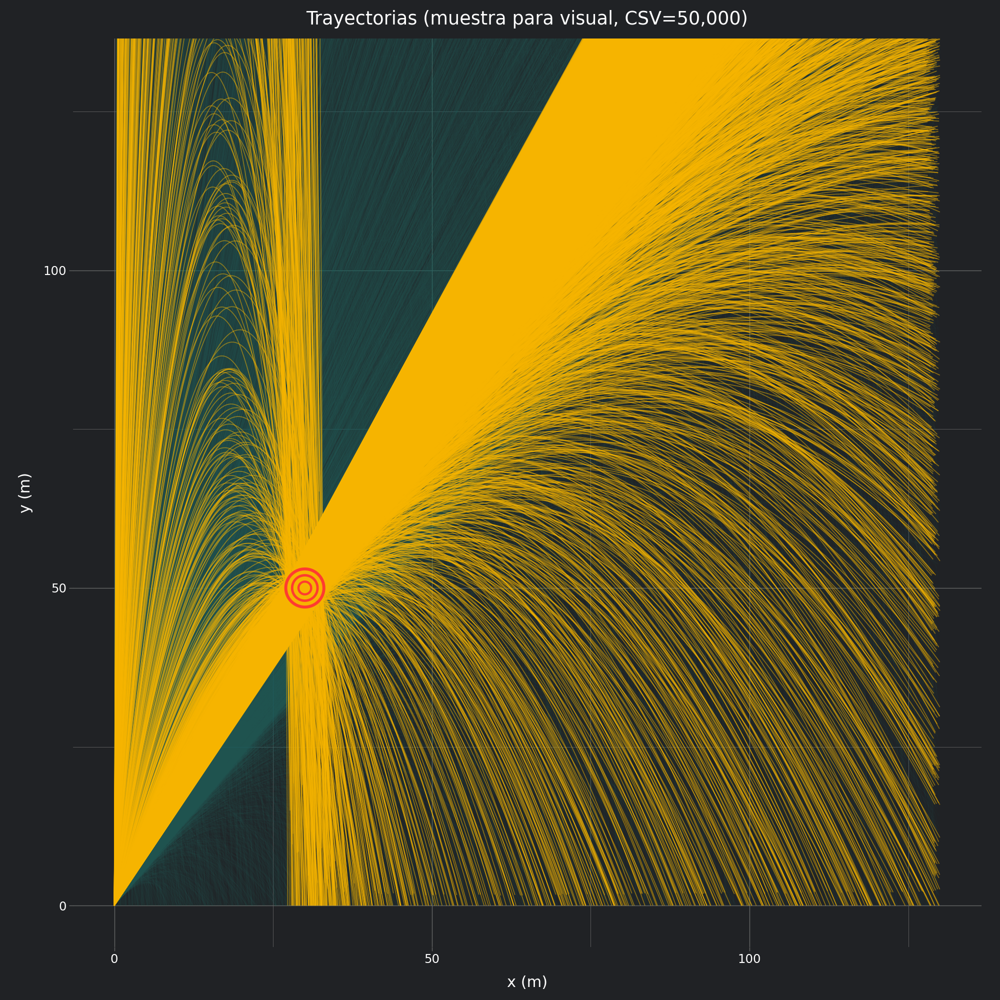

In [3]:
# ================================================================
# Gráfico de TRAYECTORIAS (plotnine)
# ================================================================
# Para que el render sea fluido, muestreamos SOLO para el gráfico:
PLOT_MAX_HIT, PLOT_MAX_MISS = 8000, 12000
hits_plot = df[df["hit"]==1].sample(n=min(PLOT_MAX_HIT,  df["hit"].sum()),  random_state=7) if df["hit"].sum()>0 else df[df["hit"]==1]
miss_plot = df[df["hit"]==0].sample(n=min(PLOT_MAX_MISS, (df["hit"]==0).sum()), random_state=7)
df_plot = pd.concat([hits_plot, miss_plot], ignore_index=True).sort_values("theta_deg")

def expand_traj(rows_df, g=9.8, x_max=130, n_time=120):
    """
    Devuelve [gid, x, y, hit] para usar con group=gid.
    NO recorta por Y; solo limita por X para no generar puntos muy lejanos.
    """
    out = []
    for idx, row in enumerate(rows_df.itertuples(index=False)):
        v0, th_deg, h = row.v0, row.theta_deg, row.hit
        th = np.deg2rad(th_deg)
        s, c = np.sin(th), np.cos(th)
        if s <= 0:
            continue

        t_f = 2.0 * v0 * s / g
        t   = np.linspace(0.0, t_f, n_time)
        x   = v0*c*t
        y   = v0*s*t - 0.5*g*t**2

        # --- SIN recorte por y_max ---
        m = (y >= 0) & (x >= 0) & (x <= x_max)   # <- quitamos (y <= y_max)

        idxs = np.flatnonzero(m)
        if idxs.size == 0:
            continue

        # dividir en tramos contiguos (por si alguna trayectoria entra/sale por X)
        splits = np.where(np.diff(idxs) > 1)[0] + 1
        for seg, run in enumerate(np.split(idxs, splits)):
            gid = f"{idx}-{seg}"
            xs, ys = x[run], y[run]
            out.extend([(gid, xx, yy, int(h)) for xx, yy in zip(xs, ys)])

    return pd.DataFrame(out, columns=["gid","x","y","hit"])

# Disco (círculos concéntricos)
theta_c = np.linspace(0, 2*np.pi, 360)
def circle_df(cx, cy, rr):
    return pd.DataFrame({"x": cx + rr*np.cos(theta_c), "y": cy + rr*np.sin(theta_c)})

circle_r   = circle_df(cx, cy, r)
circle_r23 = circle_df(cx, cy, (2*r)/3)
circle_r13 = circle_df(cx, cy, (1*r)/3)

# Colores
gold = "#f7b500"   # hits
teal = "#1f6460"   # misses
red  = "#ff3b30"   # disco
bg   = "#202225"   # fondo



# Curvas completas (sin recorte por y_max):
traj = expand_traj(df_plot, g=g, x_max=130, n_time=120)

# Recorte SOLO en la vista + relación 1:1
YMAX = 130  # o prueba 140/160 si quieres un poco más alto

p_traj = (
    ggplot()
    + geom_path(aes("x","y", group="gid"), data=traj[traj.hit==0],
                color=teal, size=0.25, alpha=0.06)
    + geom_path(aes("x","y", group="gid"), data=traj[traj.hit==1],
                color=gold, size=0.35, alpha=0.50)
    + geom_path(aes("x","y"), data=circle_r,   color=red, size=1.2)
    + geom_path(aes("x","y"), data=circle_r23, color=red, size=1.0)
    + geom_path(aes("x","y"), data=circle_r13, color=red, size=0.9)
    + coord_fixed(ratio=1, xlim=(0,130), ylim=(0,YMAX))  # <- recorte visual, no de datos
    + theme_dark()
    + theme(
        figure_size=(10,10),
        panel_background=element_rect(fill=bg, color=bg),
        plot_background=element_rect(fill=bg, color=bg),
        text=element_text(color="white"),
    )
    + labs(title=f"Trayectorias (muestra para visual, CSV={len(df):,})",
           x="x (m)", y="y (m)")
)
p_traj

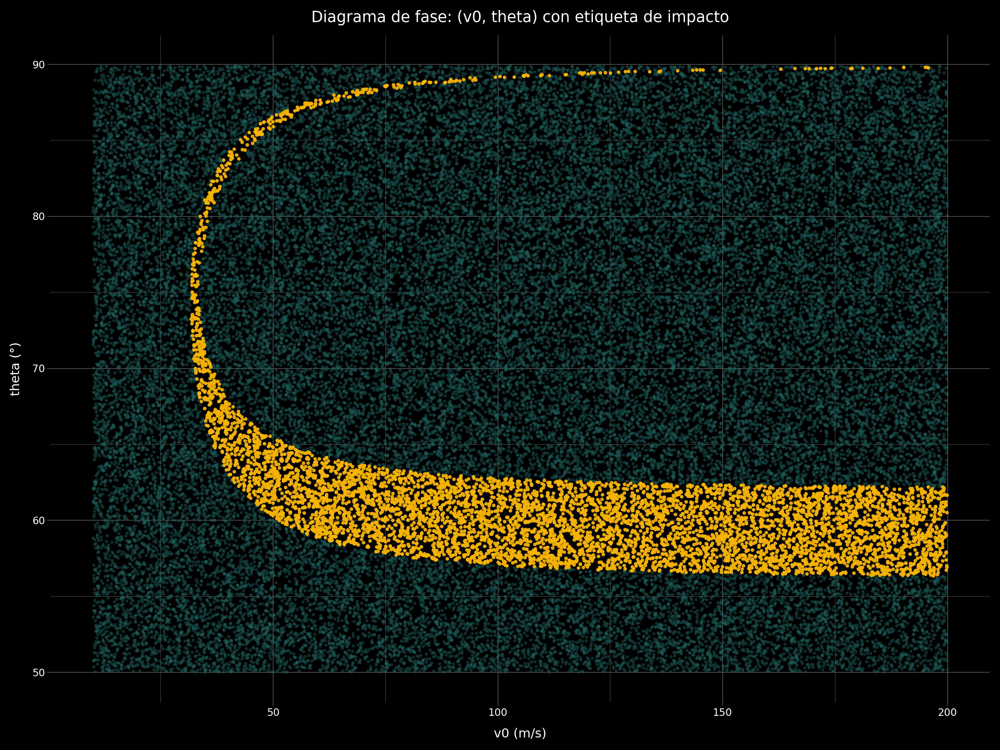

In [4]:
# Colores (los de la imagen oscura)
teal_d = "#1f6460"   # misses
gold_d = "#f7b500"   # hits
bg     = "#000000"   # fondo negro

p_phase_dark = (
    ggplot()
    + geom_point(aes("v0","theta_deg"), data=df[df["hit"]==0],
                 color=teal_d, alpha=0.35, size=0.6)
    + geom_point(aes("v0","theta_deg"), data=df[df["hit"]==1],
                 color=gold_d, alpha=0.90, size=0.75)
    + theme_dark()
    + theme(
        figure_size=(12, 9),
        panel_background=element_rect(fill=bg, color=bg),
        plot_background=element_rect(fill=bg, color=bg),
        text=element_text(color="white")
    )
    + labs(title="Diagrama de fase: (v0, theta) con etiqueta de impacto",
           x="v0 (m/s)", y="theta (°)")
)

p_phase_dark

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Mejores hiperparámetros: {'svc__C': np.float64(5727.904470799622), 'svc__gamma': np.float64(0.3795853142670636)}
Umbral óptimo (F2): 0.970763

Reporte en TEST (umbral F2):
              precision    recall  f1-score   support

           0      1.000     0.994     0.997     12996
           1      0.962     0.999     0.980      2004

    accuracy                          0.995     15000
   macro avg      0.981     0.996     0.988     15000
weighted avg      0.995     0.995     0.995     15000



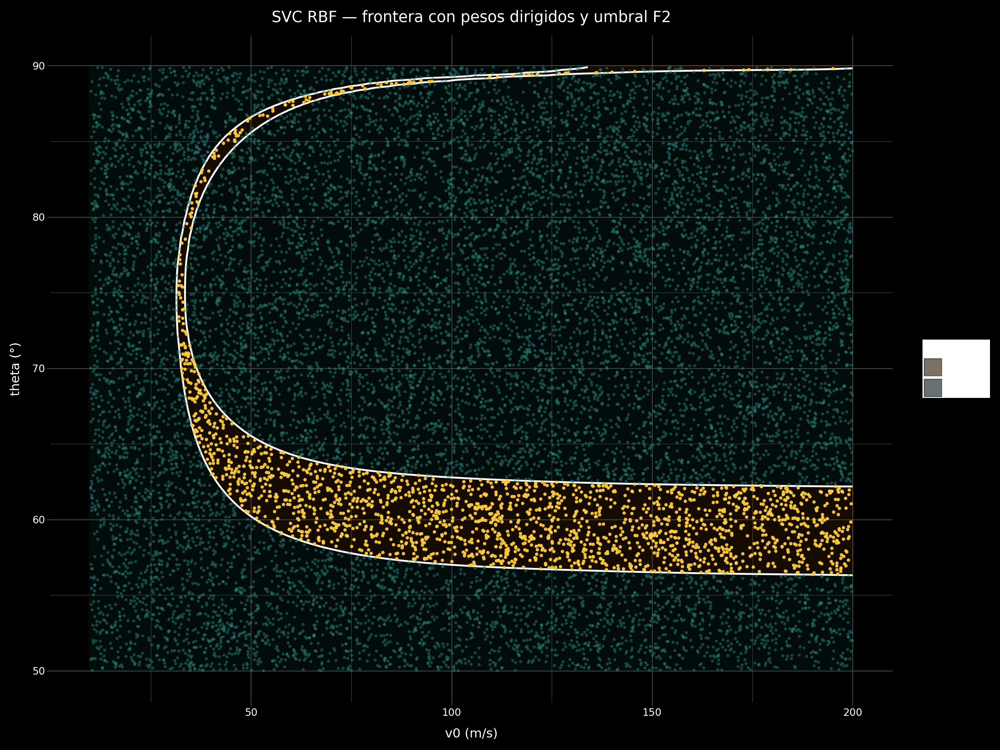

In [5]:
# ================================================================
# SVC RBF — recuperar rama superior: pesos dirigidos + F2 + C,γ amplios
# ================================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.stats import loguniform
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import fbeta_score, make_scorer, precision_recall_curve, classification_report
from plotnine import (
    ggplot, aes, geom_tile, geom_point, geom_path, theme_dark, theme,
    element_rect, element_text, labs, coord_fixed
)

# ---- Datos ----
try:
    df
except NameError:
    df = pd.read_csv("tiros_50000_v0_10a200_theta_50a90.csv")

X = df[["v0","theta_deg"]].values
y = df["hit"].values

X_tr_full, X_te, y_tr_full, y_te = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

# ---- Pesos: balance + énfasis rama alta ----
def make_weights(X, y, theta_cut=80.0, upper_mult=4.0):
    w = np.ones_like(y, dtype=float)
    pos = (y == 1)
    # balance básico (≈ ratio negativos/positivos)
    pos_n = pos.sum()
    if pos_n > 0:
        w[pos] *= (len(y) - pos_n) / pos_n
    # extra peso a hits en rama alta
    w[pos & (X[:,1] >= theta_cut)] *= upper_mult
    return w

w_tr_full = make_weights(X_tr_full, y_tr_full, theta_cut=80.0, upper_mult=4.0)

# Submuestra estratificada para el tuning + sus pesos
N_TUNE = min(20000, len(X_tr_full))
X_tune, _, y_tune, _ = train_test_split(
    X_tr_full, y_tr_full, train_size=N_TUNE, random_state=42, stratify=y_tr_full
)
w_tune = make_weights(X_tune, y_tune, theta_cut=80.0, upper_mult=4.0)

# ---- Pipeline + RandomizedSearchCV (F2 prioriza recall) ----
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="rbf", class_weight="balanced", random_state=42))
])

param_dist = {
    "svc__C": loguniform(1, 1e4),         # muy amplio
    "svc__gamma": loguniform(1e-4, 1.0),  # muy amplio
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
scorer = make_scorer(fbeta_score, beta=2.0, pos_label=1)

rs = RandomizedSearchCV(
    pipe, param_distributions=param_dist, n_iter=30,
    scoring=scorer, cv=cv, n_jobs=-1, refit=True, random_state=42, verbose=1
)
# >>> pasa pesos al paso 'svc' del pipeline
rs.fit(X_tune, y_tune, **{"svc__sample_weight": w_tune})

best_params = rs.best_params_
print("Mejores hiperparámetros:", best_params)

# ---- Calibrar umbral por F2 en validación ----
X_tr, X_va, y_tr, y_va, w_tr, w_va = train_test_split(
    X_tr_full, y_tr_full, w_tr_full, test_size=0.20, random_state=43, stratify=y_tr_full
)

mdl = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="rbf",
                C=best_params["svc__C"],
                gamma=best_params["svc__gamma"],
                class_weight="balanced",
                random_state=42))
])
mdl.fit(X_tr, y_tr, **{"svc__sample_weight": w_tr})

va_scores = mdl.decision_function(X_va)
prec, rec, thr = precision_recall_curve(y_va, va_scores)
f2 = (1+2**2) * prec * rec / np.clip(4*prec + rec, 1e-12, None)
thr_star = thr[np.nanargmax(f2[:-1])]
print("Umbral óptimo (F2):", round(thr_star, 6))

# ---- Reentrenar full-train y evaluar ----
final = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="rbf",
                C=best_params["svc__C"],
                gamma=best_params["svc__gamma"],
                class_weight="balanced",
                random_state=42))
])
final.fit(X_tr_full, y_tr_full, **{"svc__sample_weight": w_tr_full})

te_scores = final.decision_function(X_te)
y_pred = (te_scores >= thr_star).astype(int)
print("\nReporte en TEST (umbral F2):")
print(classification_report(y_te, y_pred, digits=3))

# ---- Zona de clasificación (heatmap + contorno via matplotlib) ----
v0_min, v0_max = float(df["v0"].min()), float(df["v0"].max())
th_min, th_max = float(df["theta_deg"].min()), float(df["theta_deg"].max())

n_grid = 220
v_lin = np.linspace(v0_min, v0_max, n_grid)
t_lin = np.linspace(th_min, th_max, n_grid)
VV, TT = np.meshgrid(v_lin, t_lin)
grid_mat = np.c_[VV.ravel(), TT.ravel()]

scores = final.decision_function(grid_mat)
pred   = (scores >= thr_star).astype(int)

grid = pd.DataFrame({
    "v0": VV.ravel(),
    "theta_deg": TT.ravel(),
    "score": scores,
    "pred_f": np.where(pred==1, "hit", "miss"),
    "w": (v_lin[1]-v_lin[0]),
    "h": (t_lin[1]-t_lin[0]),
})

# contorno score=thr_star → DataFrame para geom_path
def contour_df_from_grid(grid_df, level):
    v_vals = np.sort(grid_df["v0"].unique())
    t_vals = np.sort(grid_df["theta_deg"].unique())
    Z = grid_df.pivot(index="theta_deg", columns="v0", values="score").reindex(index=t_vals, columns=v_vals).values
    V, T = np.meshgrid(v_vals, t_vals)
    fig, ax = plt.subplots()
    cs = ax.contour(V, T, Z, levels=[level])
    plt.close(fig)
    lines = []
    if cs.allsegs and cs.allsegs[0]:
        for cid, seg in enumerate(cs.allsegs[0]):
            lines.append(pd.DataFrame({"v0": seg[:,0], "theta_deg": seg[:,1], "cid": cid}))
    return pd.concat(lines, ignore_index=True) if lines else pd.DataFrame(columns=["v0","theta_deg","cid"])

contour_df = contour_df_from_grid(grid, level=thr_star)

from plotnine import scale_fill_manual
fill_colors = {"miss": "#0f3d3a", "hit": "#6b3b00"}  # tonos oscuros; se suavizan con alpha
bg = "#000000"
teal_pts = "#2d8a83"; gold_pts = "#fecb3e"

# muestra de puntos reales
df_plot = df.sample(n=min(15000, len(df)), random_state=7)

p_boundary = (
    ggplot()
    + geom_tile(aes("v0","theta_deg", fill="pred_f", width="w", height="h"),
                data=grid, alpha=0.20)
    + geom_path(aes("v0","theta_deg", group="cid"),
                data=contour_df, color="white", size=0.9)
    + geom_point(aes("v0","theta_deg"), data=df_plot[df_plot["hit"]==0],
                 color=teal_pts, size=0.55, alpha=0.35)
    + geom_point(aes("v0","theta_deg"), data=df_plot[df_plot["hit"]==1],
                 color=gold_pts, size=0.65, alpha=0.90)
    + scale_fill_manual(values=fill_colors, name="Predicción")
    + theme_dark()
    + theme(
        figure_size=(12, 9),
        panel_background=element_rect(fill=bg, color=bg),
        plot_background=element_rect(fill=bg, color=bg),
        text=element_text(color="white"),
    )
    + labs(title="SVC RBF — frontera con pesos dirigidos y umbral F2",
           x="v0 (m/s)", y="theta (°)")
)
p_boundary
# p_boundary.save("svc_rbf_rama_alta.png", dpi=150)
